## Quantum Gate Based Approaches
Based upon the findings of [this paper.](https://www.nature.com/articles/s41534-021-00368-4)

# Background

Proteins are responsible for carrying out cellular funcion and constitute much of cellular biology. Despite proteins being ubiqutous throughout biology, protein folding  is a complex issue that has long perplexed scienticts, best illustrated by [Levinthal's Paradox](https://pubmed.ncbi.nlm.nih.gov/1729690/). Despite the very large amount of confirmations a polypeptide chain might have, sometimes 10300 confirmations, protein folding is a very instantaneous process in the cell, mediated, by amino acid interactions, affinities and chaperone proteins. To fully appreciate this issue, it has required very powerful computers, making scientists look to adopting a quantum advantage.

This allows us to tackle protein folding as a [Hamiltonian problem](https://en.wikipedia.org/wiki/Hamiltonian_(quantum_mechanics)), for which we can obtain an optimal minimal energy state which will correspond to our computed protein structure

In [1]:
from qiskit.circuit.library import RealAmplitudes
from qiskit.algorithms.optimizers import COBYLA
from qiskit.algorithms import NumPyMinimumEigensolver, VQE
from qiskit.opflow import PauliExpectation, CVaRExpectation
from qiskit import execute, Aer

from qiskit_nature.problems.sampling.protein_folding.interactions.miyazawa_jernigan_interaction import (
    MiyazawaJerniganInteraction,
)

from qiskit_nature.problems.sampling.protein_folding.peptide.peptide import Peptide

from qiskit_research.protein_folding.protein_folding_problem import (
    ProteinFoldingProblem,
)

from qiskit_nature.problems.sampling.protein_folding.penalty_parameters import PenaltyParameters

from qiskit.utils import algorithm_globals, QuantumInstance

algorithm_globals.random_seed = 79

import matplotlib.pyplot as plt
import pandas as pd

Currently the optomized algorithm offered by IBM's [protein folding tutorial](https://qiskit-research.github.io/qiskit-research/protein_folding/protein_folding.html) allows for simple polypetide chain models with side chains only as long as one amino acid. Let's look at one of their examples

In [2]:
main_chain = "APRLRFY" #Letters correspond to common amino acid nomenclature
side_chains = [""] * len(main_chain) # empty due to a neccesity in function

In [3]:
#interactions
mj_interaction = MiyazawaJerniganInteraction()

The algorthm allows for Miyazawa Jernigan interactions, or random interactions, which need to be omported accordingly. I chose Miyazwa Jerigan interactions to reflect the different affiinities different amino acids have for each other, which is one the main factors in protein folding

The algorithm also needs you to set three types of penalties, a back penalty, to inhibit amino acids from folding back onto each other as the polypetide extends, a chirality penality, to impose optimal and [biologically possible chiralty,](https://pubmed.ncbi.nlm.nih.gov/23019095/) and a type of overlap penalty to stop amino acids from taking soace allready taken by existing amino acids. 

The tutorial chose 10 for all of these penalties

In [4]:
penalty_back = 10
penalty_chiral = 10
penalty_overlap = 10

penalty_terms = PenaltyParameters(penalty_chiral, penalty_back, penalty_overlap) #Yes this is the order they go in

In [5]:
peptide = Peptide(main_chain, side_chains)

protein_folding_problem = ProteinFoldingProblem(peptide, mj_interaction, penalty_terms)
qubit_op = protein_folding_problem.qubit_op()

In [6]:
print(qubit_op)

1613.5895000000003 * IIIIIIIII
+ 487.5 * IIIIIIZII
- 192.5 * IIIIIIIZZ
+ 192.5 * IIIIIIZZZ
- 195.0 * IIIIZIZII
- 195.0 * IIIIIZIZI
- 195.0 * IIIIZZZZI
- 95.0 * IIZIZIIII
- 95.0 * IIIZIZIII
- 95.0 * IIZZZZIII
+ 295.0 * IIIIIIZZI
- 497.5 * IIIIZIIII
- 300.0 * IIIIZZIII
+ 195.0 * IIIIIIIIZ
+ 197.5 * IIIIIZIIZ
- 197.5 * IIIIZZIIZ
- 904.2875 * IZIIIIIII
- 295.0 * IZIIIIZII
- 197.5 * IZIIIIZZI
+ 302.5 * IZIIZIIII
+ 202.5 * IZIIZZIII
+ 100.0 * IZIIZIZII
+ 100.0 * IZIIIZIZI
+ 100.0 * IZIIZZZZI
- 200.0 * IZIIIIIIZ
+ 97.5 * IZIIIIIZZ
- 97.5 * IZIIIIZZZ
- 100.0 * IZIIIZIIZ
+ 100.0 * IZIIZZIIZ
+ 100.0 * IIIIIIIZI
- 100.0 * IIIIIZIII
+ 2.5 * IZIIIIIZI
- 2.5 * IZIIIZIII
+ 192.5 * IIZIIIIII
+ 95.0 * IIZZIIIII
+ 97.5 * IIZIIIZII
+ 97.5 * IIIZIIIZI
+ 97.5 * IIZZIIZZI
- 97.5 * IIIZIIIIZ
+ 97.5 * IIZZIIIIZ
+ 7.5 * IZZIIIIII
+ 5.0 * IZZZIIIII
+ 2.5 * IZZIIIZII
+ 2.5 * IZIZIIIZI
+ 2.5 * IZZZIIZZI
- 2.5 * IZZIZIIII
- 2.5 * IZIZIZIII
- 2.5 * IZZZZZIII
- 2.5 * IZIZIIIIZ
+ 2.5 * IZZZIIIIZ
+ 105.0 * IIIZIIIII
-

## VQE 
The [variational quantum eigensolver](https://medium.com/qiskit/a-novel-quantum-algorithm-for-protein-folding-paving-the-way-toward-resolving-one-of-the-biggest-861112139ff0) allows us to solve our Hamiltonian and obtain amplitudes for each computable bitstring combination the qubits can configure themselves when modeling this protein

In [7]:
# set classical optimizer
optimizer = COBYLA(maxiter=50)

# set variational ansatz
ansatz = RealAmplitudes(reps=1)

# set the backend
backend_name = "aer_simulator"
backend = QuantumInstance(
    Aer.get_backend(backend_name),
    shots=8192,
    seed_transpiler=algorithm_globals.random_seed,
    seed_simulator=algorithm_globals.random_seed,
)

counts = []
values = []


def store_intermediate_result(eval_count, parameters, mean, std):
    counts.append(eval_count)
    values.append(mean)


# initialize CVaR_alpha objective with alpha = 0.1
cvar_exp = CVaRExpectation(0.1, PauliExpectation())

# initialize VQE using CVaR
vqe = VQE(
    expectation=cvar_exp,
    optimizer=optimizer,
    ansatz=ansatz,
    quantum_instance=backend,
    callback=store_intermediate_result,
)

raw_result = vqe.compute_minimum_eigenvalue(qubit_op) 
print(raw_result)

{   'aux_operator_eigenvalues': None,
    'cost_function_evals': 50,
    'eigenstate': {   '000000010': 0.034938562148434216,
                      '000000011': 0.011048543456039806,
                      '000000100': 0.027063293868263706,
                      '000000101': 0.038273277230987154,
                      '000001101': 0.011048543456039806,
                      '000001111': 0.011048543456039806,
                      '000010010': 0.038273277230987154,
                      '000010011': 0.015625,
                      '000010100': 0.034938562148434216,
                      '000010101': 0.04419417382415922,
                      '000010111': 0.011048543456039806,
                      '000011001': 0.011048543456039806,
                      '000011101': 0.02209708691207961,
                      '000100000': 0.015625,
                      '000100010': 0.13441133229754104,
                      '000100011': 0.06987712429686843,
                      '000100100': 0.1076878808

In [8]:
parameters = list(ansatz.parameters)
circuits = vqe.construct_circuit(parameters, qubit_op)

for circuit in circuits:
    print(circuit.draw())

     »
q_0: »
     »
q_1: »
     »
q_2: »
     »
q_3: »
     »
q_4: »
     »
q_5: »
     »
q_6: »
     »
q_7: »
     »
q_8: »
     »
«     ┌────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
«q_0: ┤0                                                                                                                   ├
«     │                                                                                                                    │
«q_1: ┤1                                                                                                                   ├
«     │                                                                                                                    │
«q_2: ┤2                                                                                                                   ├
«     │                                                                                                              

According to the [paper](https://www.nature.com/articles/s41534-021-00368-4), qubit depth should be two, but unfortunately this circuit is not very infromative

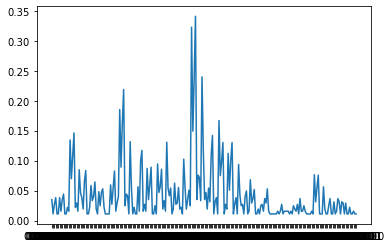

In [9]:
amplitude_list = raw_result.eigenstate.items()
x, y = zip(*amplitude_list)
plt.plot(x,y)
plt.show()

The above graph shows a rough visualization of our Hamiltonian, with the x-axis corresponding to various eigenstates/bitstring confirmations and the y-axis corresponding to amplitude. The higher amplitudes corresponded to lower conformation energies, and therefore the more likely configurations

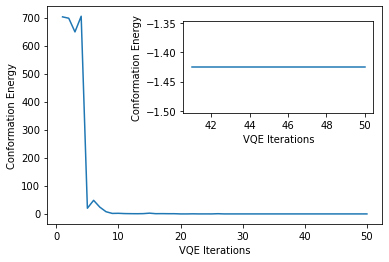

In [10]:
fig = plt.figure()

plt.plot(counts, values)
plt.ylabel("Conformation Energy")
plt.xlabel("VQE Iterations")

fig.add_axes([0.44, 0.51, 0.44, 0.32])

plt.plot(counts[40:], values[40:])
plt.ylabel("Conformation Energy")
plt.xlabel("VQE Iterations")
plt.show()

This graph indicates that the conformation energy does in fact get lower the more VQE iterations were executed

In [11]:
result = protein_folding_problem.interpret(raw_result)

print(
    "The bitstring representing the shape of the protein during optimization is: ",
    result.turn_sequence,
)
print("The expanded expression is:", result.get_result_binary_vector())


The bitstring representing the shape of the protein during optimization is:  010100101
The expanded expression is: 0______1_____________________________________________________________________________________________________________________________010010_1____


In [12]:
print(f"The folded protein's main sequence of turns is: {result.protein_shape_decoder.main_turns}")
print(f"and the side turn sequences are: {result.protein_shape_decoder.side_turns}") # none becyz  no side chains

The folded protein's main sequence of turns is: [1, 0, 3, 1, 0, 2]
and the side turn sequences are: [None, None, None, None, None, None, None]


In [13]:
print(result.protein_shape_file_gen.get_xyz_data())

[['A' '0.0' '0.0' '0.0']
 ['P' '0.5773502691896258' '0.5773502691896258' '-0.5773502691896258']
 ['R' '1.1547005383792517' '0.0' '-1.1547005383792517']
 ['L' '1.7320508075688776' '-0.5773502691896258' '-0.5773502691896258']
 ['R' '1.154700538379252' '-1.1547005383792517' '0.0']
 ['F' '0.5773502691896261' '-0.5773502691896258' '0.5773502691896258']
 ['Y' '1.154700538379252' '0.0' '1.1547005383792517']]


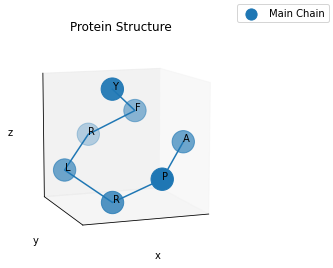

In [14]:
fig = result.get_figure(title="Protein Structure", ticks=False, grid=True)
fig.get_axes()[0].view_init(10, 70)

Qiskit nature allows you to create these rough protein structures. This was a only polypetide chain, which is rarely the case in nature. Let's look at there example including a side chain

In [15]:
peptide = Peptide("APRLR", ["", "", "F", "Y", ""])
protein_folding_problem = ProteinFoldingProblem(peptide, mj_interaction, penalty_terms)
qubit_op = protein_folding_problem.qubit_op()
raw_result = vqe.compute_minimum_eigenvalue(qubit_op)
result_2 = protein_folding_problem.interpret(raw_result=raw_result)

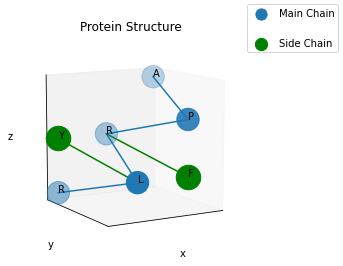

In [16]:
fig = result_2.get_figure(title="Protein Structure", ticks=False, grid=True)
fig.get_axes()[0].view_init(10, 60)

This was the end of their tutorial

## Independent Exploration
I thought that the choices of 10 for each penalty were very arbitray so I wanted to change the values to observe the effect on the protein structure. Intuitively, the protein sequence and their interactions should have the strongest and only substantial effect on the structure. 

To see if that would be true here, I started with a penalty sweep

Knowing from experience, if the numbers get too high, one component overpowers the other mathematically, so I tried a gentle sweep

## Penalty Sweep

In [17]:
peptide = Peptide(main_chain, side_chains)
penalties_back = [8,9,10,11,12]
penalties_chiral = [8,9,10,11,12]
penalties_overlap = [8,9,10,11,12]

params_list = []
raw_results = []
results = []
turn_sequences = []

for p_back in penalties_back:
    for p_chiral in penalties_chiral:
        for p_overlap in penalties_overlap:
            
            p_terms = PenaltyParameters(p_chiral, p_back, p_overlap)
            params_list.append([p_chiral, p_back, p_overlap])
            
            protein_folding_problem = ProteinFoldingProblem(peptide, mj_interaction, p_terms)
            q_op = protein_folding_problem.qubit_op()
            raw_result = vqe.compute_minimum_eigenvalue(q_op)
            raw_results.append(raw_result)
            
            result = protein_folding_problem.interpret(raw_result=raw_result)
            results.append(result)
            
            sequence = result.turn_sequence
            turn_sequences.append(sequence)
            print(f'penalty_back={p_back}, penalty_chiral={p_chiral}, penalty_overlap={p_overlap}')
            
            print("---------")

penalty_back=8, penalty_chiral=8, penalty_overlap=8
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=8, penalty_chiral=8, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=8, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=8, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=8, penalty_chiral=8, penalty_overlap=12
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=8
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=8, penalty_chiral=9, penalty_overlap=12
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=8
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=8, penalty_chiral=10, penalty_overlap=12
---------
penalty_back=8, penalty_chiral=11, penalty_overlap=8
---------
penalty_back=8, penalty_chiral=11, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=11, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=11, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=8, penalty_chiral=11, penalty_overlap=12
---------
penalty_back=8, penalty_chiral=12, penalty_overlap=8
---------
penalty_back=8, penalty_chiral=12, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=12, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=12, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=8, penalty_chiral=12, penalty_overlap=12
---------
penalty_back=9, penalty_chiral=8, penalty_overlap=8
---------
penalty_back=9, penalty_chiral=8, penalty_overlap=9
---------
penalty_back=9, penalty_chiral=8, penalty_overlap=10
---------
penalty_back=9, penalty_chiral=8, penalty_overlap=11
---------
penalty_back=9, penalty_chiral=8, penalty_overlap=12
---------
penalty_back=9, penalty_chiral=9, penalty_overlap=8
---------
penalty_back=9, penalty_chiral=9, penalty_overlap=9
---------
penalty_back=9, penalty_chiral=9, penalty_overlap=10
---------
penalty_back=9, penalty_chiral=9, penalty_overlap=11
---------
penalty_back=9, penalty_chiral=9, penalty_overlap=12
---------
penalty_back=9, penalty_chiral=10, penalty_overlap=8
---------
penalty_back=9, penalty_chiral=10, penalty_overlap=9
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=9, penalty_chiral=10, penalty_overlap=10
---------
penalty_back=9, penalty_chiral=10, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=9, penalty_chiral=10, penalty_overlap=12
---------
penalty_back=9, penalty_chiral=11, penalty_overlap=8
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=9, penalty_chiral=11, penalty_overlap=9
---------
penalty_back=9, penalty_chiral=11, penalty_overlap=10
---------
penalty_back=9, penalty_chiral=11, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=9, penalty_chiral=11, penalty_overlap=12
---------
penalty_back=9, penalty_chiral=12, penalty_overlap=8
---------
penalty_back=9, penalty_chiral=12, penalty_overlap=9
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=9, penalty_chiral=12, penalty_overlap=10
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=9, penalty_chiral=12, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=9, penalty_chiral=12, penalty_overlap=12
---------
penalty_back=10, penalty_chiral=8, penalty_overlap=8
---------
penalty_back=10, penalty_chiral=8, penalty_overlap=9
---------
penalty_back=10, penalty_chiral=8, penalty_overlap=10
---------
penalty_back=10, penalty_chiral=8, penalty_overlap=11
---------
penalty_back=10, penalty_chiral=8, penalty_overlap=12
---------
penalty_back=10, penalty_chiral=9, penalty_overlap=8
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=10, penalty_chiral=9, penalty_overlap=9
---------
penalty_back=10, penalty_chiral=9, penalty_overlap=10
---------
penalty_back=10, penalty_chiral=9, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=10, penalty_chiral=9, penalty_overlap=12
---------
penalty_back=10, penalty_chiral=10, penalty_overlap=8
---------
penalty_back=10, penalty_chiral=10, penalty_overlap=9
---------
penalty_back=10, penalty_chiral=10, penalty_overlap=10
---------
penalty_back=10, penalty_chiral=10, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=10, penalty_chiral=10, penalty_overlap=12
---------
penalty_back=10, penalty_chiral=11, penalty_overlap=8
---------
penalty_back=10, penalty_chiral=11, penalty_overlap=9
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=10, penalty_chiral=11, penalty_overlap=10
---------
penalty_back=10, penalty_chiral=11, penalty_overlap=11
---------
penalty_back=10, penalty_chiral=11, penalty_overlap=12
---------
penalty_back=10, penalty_chiral=12, penalty_overlap=8
---------
penalty_back=10, penalty_chiral=12, penalty_overlap=9
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=10, penalty_chiral=12, penalty_overlap=10
---------
penalty_back=10, penalty_chiral=12, penalty_overlap=11
---------
penalty_back=10, penalty_chiral=12, penalty_overlap=12
---------
penalty_back=11, penalty_chiral=8, penalty_overlap=8
---------
penalty_back=11, penalty_chiral=8, penalty_overlap=9
---------
penalty_back=11, penalty_chiral=8, penalty_overlap=10
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=11, penalty_chiral=8, penalty_overlap=11
---------
penalty_back=11, penalty_chiral=8, penalty_overlap=12
---------
penalty_back=11, penalty_chiral=9, penalty_overlap=8
---------
penalty_back=11, penalty_chiral=9, penalty_overlap=9
---------
penalty_back=11, penalty_chiral=9, penalty_overlap=10
---------
penalty_back=11, penalty_chiral=9, penalty_overlap=11
---------
penalty_back=11, penalty_chiral=9, penalty_overlap=12
---------
penalty_back=11, penalty_chiral=10, penalty_overlap=8
---------
penalty_back=11, penalty_chiral=10, penalty_overlap=9
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=11, penalty_chiral=10, penalty_overlap=10
---------
penalty_back=11, penalty_chiral=10, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=11, penalty_chiral=10, penalty_overlap=12
---------
penalty_back=11, penalty_chiral=11, penalty_overlap=8
---------
penalty_back=11, penalty_chiral=11, penalty_overlap=9
---------
penalty_back=11, penalty_chiral=11, penalty_overlap=10
---------
penalty_back=11, penalty_chiral=11, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=11, penalty_chiral=11, penalty_overlap=12
---------
penalty_back=11, penalty_chiral=12, penalty_overlap=8
---------
penalty_back=11, penalty_chiral=12, penalty_overlap=9
---------
penalty_back=11, penalty_chiral=12, penalty_overlap=10
---------
penalty_back=11, penalty_chiral=12, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=11, penalty_chiral=12, penalty_overlap=12
---------
penalty_back=12, penalty_chiral=8, penalty_overlap=8
---------
penalty_back=12, penalty_chiral=8, penalty_overlap=9
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=12, penalty_chiral=8, penalty_overlap=10
---------
penalty_back=12, penalty_chiral=8, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=12, penalty_chiral=8, penalty_overlap=12
---------
penalty_back=12, penalty_chiral=9, penalty_overlap=8
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=12, penalty_chiral=9, penalty_overlap=9
---------
penalty_back=12, penalty_chiral=9, penalty_overlap=10
---------
penalty_back=12, penalty_chiral=9, penalty_overlap=11
---------
penalty_back=12, penalty_chiral=9, penalty_overlap=12
---------
penalty_back=12, penalty_chiral=10, penalty_overlap=8
---------
penalty_back=12, penalty_chiral=10, penalty_overlap=9
---------
penalty_back=12, penalty_chiral=10, penalty_overlap=10
---------
penalty_back=12, penalty_chiral=10, penalty_overlap=11
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=12, penalty_chiral=10, penalty_overlap=12
---------
penalty_back=12, penalty_chiral=11, penalty_overlap=8
---------
penalty_back=12, penalty_chiral=11, penalty_overlap=9
---------
penalty_back=12, penalty_chiral=11, penalty_overlap=10
---------
penalty_back=12, penalty_chiral=11, penalty_overlap=11
---------
penalty_back=12, penalty_chiral=11, penalty_overlap=12
---------
penalty_back=12, penalty_chiral=12, penalty_overlap=8
---------


C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit\algorithms\minimum_eigen_solvers\vqe.py:625: RuntimeWarning: invalid value encountered in sqrt
  estimator_error = np.sqrt(variance / self.quantum_instance.run_config.shots)


penalty_back=12, penalty_chiral=12, penalty_overlap=9
---------
penalty_back=12, penalty_chiral=12, penalty_overlap=10
---------
penalty_back=12, penalty_chiral=12, penalty_overlap=11
---------
penalty_back=12, penalty_chiral=12, penalty_overlap=12
---------


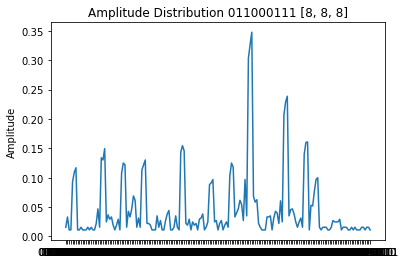

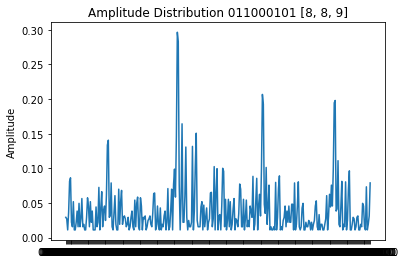

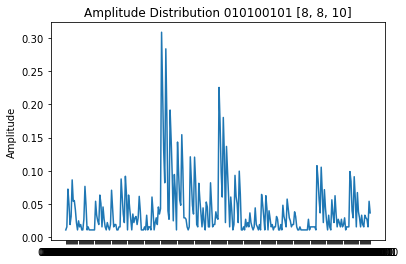

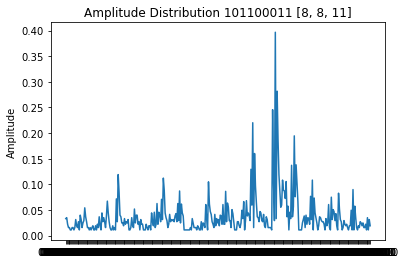

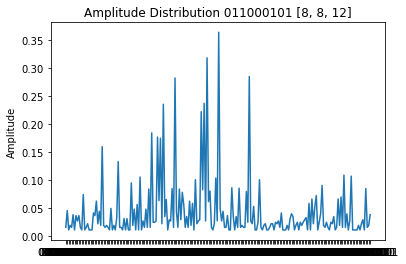

...

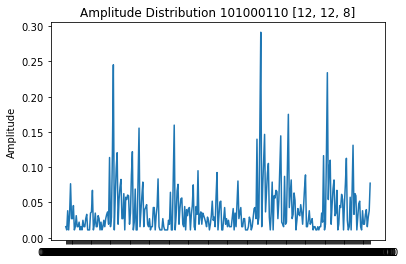

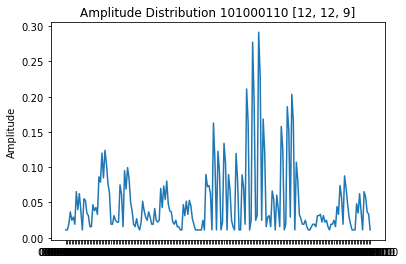

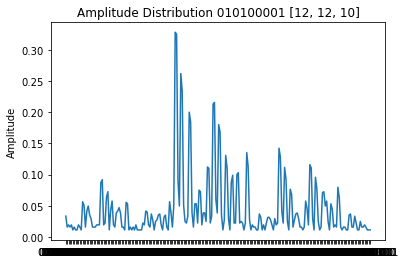

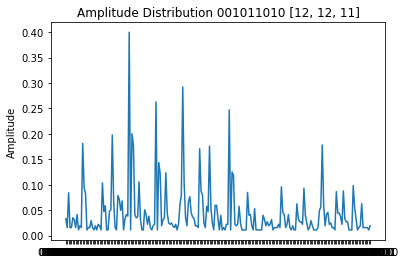

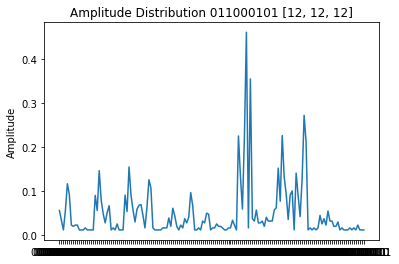

In [20]:
def amplitude_plots(params_list, raw_results, turn_sequences):
    """
    Compute all amplitude distribution for a Hamiltonian corresponding to protein folding 
    when given triplet wise lists of paramaers (params_list), raw results (raw_results), and turn sequences
    
    Args:
        params_list - list; A lists of penalty parameter combinations, already in list format
        raw_results = list; A list of computed minimum eigenvalues corresponding to protein confirmations
        turn_sequences = list; A list of turn seuqnces corresponding to most likely protein confirmations
    """
    for i in range(len(params_list)):
        amplitude_list = raw_results[i].eigenstate.items()
        x, y = zip(*amplitude_list)
        plt.plot(x,y)
        plt.title('Amplitude Distribution ' + str(turn_sequences[i]) + ' '+ str(params_list[i]))
        plt.ylabel('Amplitude')
        plt.show() 
        
amplitude_plots(params_list, raw_results, turn_sequences)

# Compiling Data

In [21]:
amino_acid_data = []

for i in range(len(results)):
    amino_acid_data.append(results[i].protein_shape_file_gen.get_xyz_data())

pure_values = []

for i in range(len(amino_acid_data)):
    for j in range(len(amino_acid_data[0])): # 0 is a placeholder number
        for k in range(len(amino_acid_data[0][0])):
            try:
                pure_values.append(float(amino_acid_data[i][j][k]))
            except ValueError:
                None
                
xyz_coord = list(zip(*[iter(pure_values)]*3))
aa_xyz_coord = list(zip(*[iter(xyz_coord)]*7))

In [22]:
col_names= []

for i in main_chain:
    col_names.append(i)
    

df_dict = {'Turn_Sequences':turn_sequences, 
      'Penalities (back, chiral, overlap)':params_list,
      }
df1 = pd.DataFrame(df_dict)

df2 = pd.DataFrame(aa_xyz_coord)
df2.columns = col_names

final_results = pd.concat([df1,df2], axis =1)

final_results

,Turn_Sequences,"Penalities (back, chiral, overlap)",A,P,R,L,R,F,Y
0,011000111,"[8, 8, 8]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(1.154700538379252, 0.0, -1.1547005383792517)","(0.5773502691896261, 0.5773502691896258, -0.57...","(2.220446049250313e-16, 0.0, 0.0)"
1,011000101,"[8, 8, 9]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(1.154700538379252, -1.1547005383792517, 0.0)","(0.5773502691896261, -0.5773502691896258, 0.57...","(2.220446049250313e-16, -1.1547005383792517, 1..."
2,010100101,"[8, 8, 10]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(1.154700538379252, -1.1547005383792517, 0.0)","(0.5773502691896261, -0.5773502691896258, 0.57...","(1.154700538379252, 0.0, 1.1547005383792517)"
3,101100011,"[8, 8, 11]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(2.3094010767585034, 0.0, 0.0)","(1.7320508075688776, 0.5773502691896258, 0.577...","(1.154700538379252, 1.1547005383792517, 0.0)"
4,011000101,"[8, 8, 12]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(1.154700538379252, -1.1547005383792517, 0.0)","(0.5773502691896261, -0.5773502691896258, 0.57...","(2.220446049250313e-16, -1.1547005383792517, 1..."
...,...,...,...,...,...,...,...,...,...
120,101000110,"[12, 12, 8]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(1.154700538379252, 1.1547005383792517, -2.309...","(0.5773502691896261, 1.7320508075688776, -1.73...","(2.220446049250313e-16, 1.154700538379252, -1...."
121,101000110,"[12, 12, 9]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(1.154700538379252, 1.1547005383792517, -2.309...","(0.5773502691896261, 1.7320508075688776, -1.73...","(2.220446049250313e-16, 1.154700538379252, -1...."
122,010100001,"[12, 12, 10]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(2.3094010767585034, -1.1547005383792517, -1.1...","(1.7320508075688776, -0.5773502691896258, -0.5...","(2.3094010767585034, 0.0, 0.0)"
123,001011010,"[12, 12, 11]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(2.3094010767585034, 1.1547005383792517, -1.15...","(2.886751345948129, 0.5773502691896258, -0.577...","(2.3094010767585034, 0.0, -2.220446049250313e-16)"


# Most Common Turn Sequence

In [25]:
final_results["Turn_Sequences"].value_counts().head()

011000101    27
010100101    15
101000010    10
101000110    10
101000101     5
Name: Turn_Sequences, dtype: int64

C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit_research\protein_folding\utils\protein_plotter.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  self._fig = plt.figure()


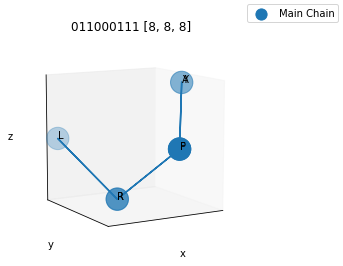

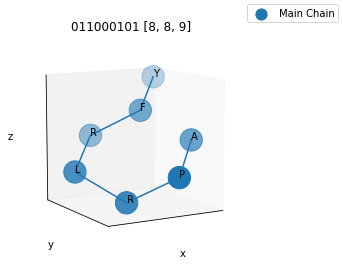

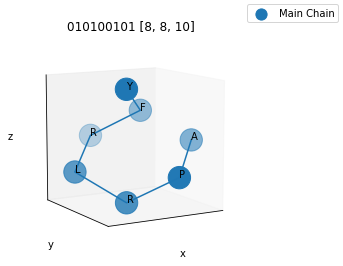

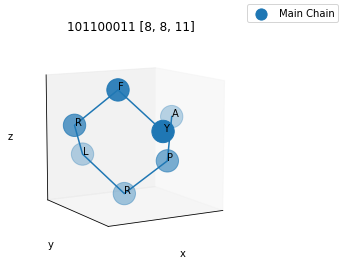

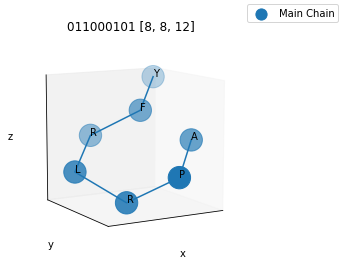

...

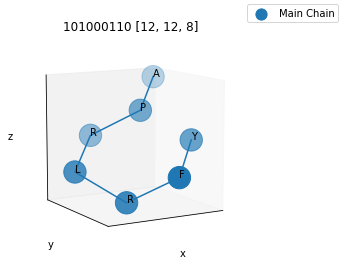

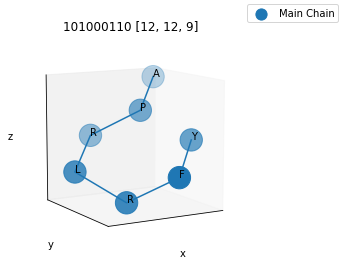

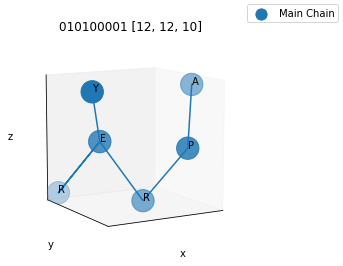

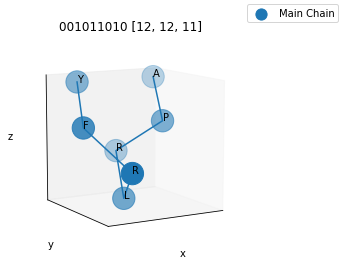

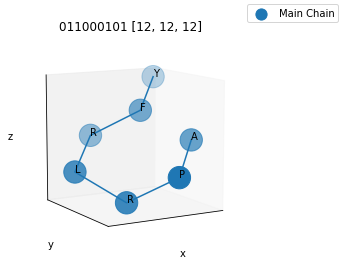

In [27]:
def protein_plots(params_list, results, turn_sequences):
    """
    Compute all protein visualizations for a Hamiltonian corresponding to protein folding 
    when given triplet wise lists of paramaers (params_list), raw results (raw_results), and turn sequences
    
    Args:
        params_list - list; A lists of penalty parameter combinations, already in list format
        results = list; A list of computed interpreted protein folding problem result 
        turn_sequences = list; A list of turn seuqnces corresponding to most likely protein confirmations
    """
    for i in range(len(params_list)):
        fig = results[i].get_figure(title= str(turn_sequences[i])+ " " + str(params_list[i]), ticks=False, grid=True)
        fig.get_axes()[0].view_init(10, 60)
              
protein_plots(params_list, results, turn_sequences)

Upon closer inspection, the most common turn sequence of 010100101, (ex, 8,8,10) which is what we started with, which is good news, and indicates that thisrange of values and choosing 10 for everything is feasibly useful

Let's take a look at the side chain model under the same parameters

# With Side Chains

In [28]:
side_chains = ["", "", "F", "Y", ""] # first and last spots not allowed to have side chains in this algorithm
main_chain_for_side = "APRLR"
peptide = Peptide(main_chain_for_side, side_chains)
penalties_back = [8,9,10,11,12]
penalties_chiral = [8,9,10,11,12]
penalties_overlap = [8,9,10,11,12]

params_list = []
side_raw_results = []
side_results = []
side_turn_sequences = []

for p_back in penalties_back:
    for p_chiral in penalties_chiral:
        for p_overlap in penalties_overlap:
            
            p_terms = PenaltyParameters(p_chiral, p_back, p_overlap)
            params_list.append([p_chiral, p_back, p_overlap])
            
            protein_folding_problem = ProteinFoldingProblem(peptide, mj_interaction, p_terms)
            q_op = protein_folding_problem.qubit_op()
            raw_result = vqe.compute_minimum_eigenvalue(q_op)
            side_raw_results.append(raw_result)
            
            result = protein_folding_problem.interpret(raw_result=raw_result)
            side_results.append(result)
            
            sequence = result.turn_sequence
            side_turn_sequences.append(sequence)
            print(f'penalty_back={p_back}, penalty_chiral={p_chiral}, penalty_overlap={p_overlap}')
            
            print("---------")

penalty_back=8, penalty_chiral=8, penalty_overlap=8
---------
penalty_back=8, penalty_chiral=8, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=8, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=8, penalty_overlap=11
---------
penalty_back=8, penalty_chiral=8, penalty_overlap=12
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=8
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=11
---------
penalty_back=8, penalty_chiral=9, penalty_overlap=12
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=8
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=9
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=10
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=11
---------
penalty_back=8, penalty_chiral=10, penalty_overlap=12
---------
penalty_back=8, penalty_chiral=11, penalty_overlap=8
---

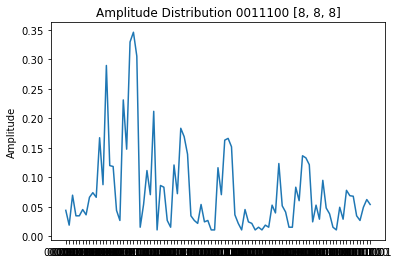

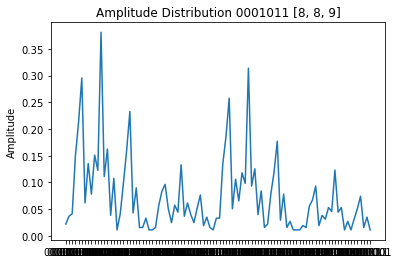

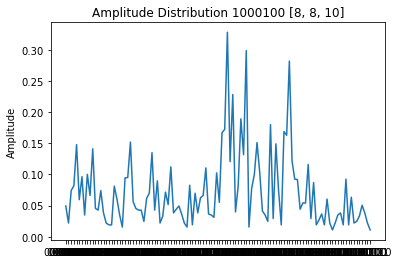

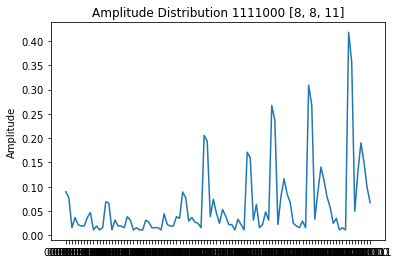

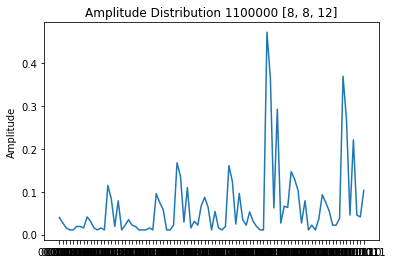

...

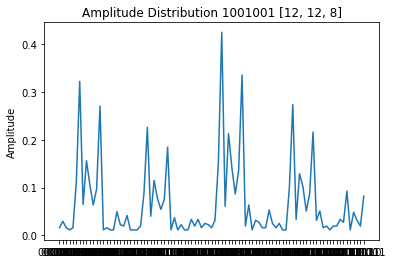

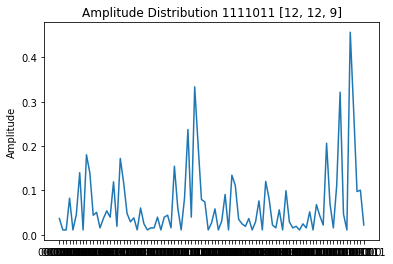

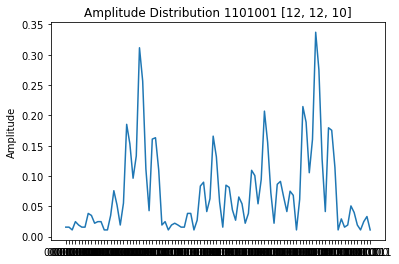

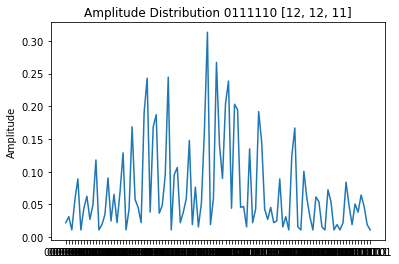

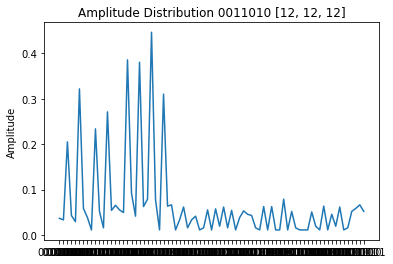

In [29]:
amplitude_plots(params_list,side_raw_results,side_turn_sequences)

# Side Chains Data

In [30]:
side_amino_acid_data = []

for i in range(len(side_results)):
    side_amino_acid_data.append(side_results[i].protein_shape_file_gen.get_xyz_data())
    
side_pure_values = []

for i in range(len(side_amino_acid_data)):
    for j in range(len(side_amino_acid_data[0])): # 0 is a placeholder number
        for k in range(len(side_amino_acid_data[0][0])):
            try:
                side_pure_values.append(float(side_amino_acid_data[i][j][k]))
            except ValueError:
                None
                
side_xyz_coord = list(zip(*[iter(side_pure_values)]*3))
side_aa_xyz_coord = list(zip(*[iter(side_xyz_coord)]*(len(main_chain_for_side)+2))) #main + 2 existing sides

In [31]:
col_names=[]

for i in main_chain_for_side:
    col_names.append(i)
    
# For existing side chains
for i in range(len(side_chains)):
    if side_chains[i] != "":
        col_names.append(side_chains[i] + " side on " + main_chain_for_side[i])

df_dict = {'Turn_Sequences':side_turn_sequences, 
      'Penalities (back, chiral, overlap)':params_list,
      }
df1 = pd.DataFrame(df_dict)

df2 = pd.DataFrame(side_aa_xyz_coord)
df2.columns = col_names

side_final_results = pd.concat([df1,df2], axis =1)

side_final_results

,Turn_Sequences,"Penalities (back, chiral, overlap)",A,P,R,L,R,F side on R,Y side on L
0,0011100,"[8, 8, 8]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(1.154700538379252, 0.0, -1.154700538379252)","(0.5773502691896258, 0.5773502691896258, -1.73...","(1.154700538379252, 1.1547005383792517, -1.154..."
1,0001011,"[8, 8, 9]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(2.3094010767585034, 0.0, 0.0)","(1.7320508075688776, 0.5773502691896258, -0.57...","(1.154700538379252, 0.0, 0.0)"
2,1000100,"[8, 8, 10]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(1.154700538379252, 0.0, -1.154700538379252)","(1.7320508075688776, -0.5773502691896258, -1.7...","(2.3094010767585034, 1.1547005383792517, -2.30..."
3,1111000,"[8, 8, 11]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(2.3094010767585034, 0.0, -2.3094010767585034)","(0.5773502691896258, 0.5773502691896258, -1.73...","(2.3094010767585034, 0.0, -1.154700538379252)"
4,1100000,"[8, 8, 12]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(2.3094010767585034, 0.0, -2.3094010767585034)","(1.7320508075688776, -0.5773502691896258, -1.7...","(2.3094010767585034, 0.0, -1.154700538379252)"
...,...,...,...,...,...,...,...,...,...
120,1001001,"[12, 12, 8]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(2.3094010767585034, -1.1547005383792517, -1.1...","(1.7320508075688776, 0.5773502691896258, -0.57...","(2.3094010767585034, 0.0, -1.1547005383792517)"
121,1111011,"[12, 12, 9]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(2.3094010767585034, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -1.73...","(2.3094010767585034, -1.1547005383792517, 0.0)"
122,1101001,"[12, 12, 10]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, -0.5773502691896258, -0.5...","(2.3094010767585034, -1.1547005383792517, -1.1...","(1.7320508075688776, 0.5773502691896258, -0.57...","(2.3094010767585034, -1.1547005383792517, 0.0)"
123,0111110,"[12, 12, 11]","(0.0, 0.0, 0.0)","(0.5773502691896258, 0.5773502691896258, -0.57...","(1.1547005383792517, 0.0, -1.1547005383792517)","(1.7320508075688776, 0.5773502691896258, -1.73...","(1.154700538379252, 1.1547005383792517, -2.309...","(0.5773502691896258, 0.5773502691896258, -1.73...","(1.154700538379252, 0.0, -2.3094010767585034)"


In [34]:
side_final_results["Turn_Sequences"].value_counts().head()

1111000    13
1001011     7
0011010     7
0111110     7
0101001     4
Name: Turn_Sequences, dtype: int64

C:\Users\14033\Anaconda3\envs\workshop-qml\lib\site-packages\qiskit_research\protein_folding\utils\protein_plotter.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  self._fig = plt.figure()


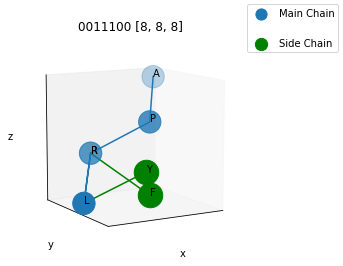

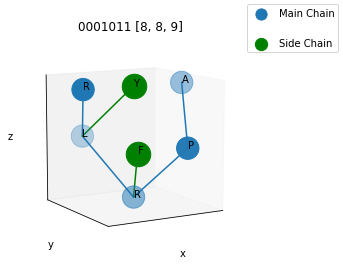

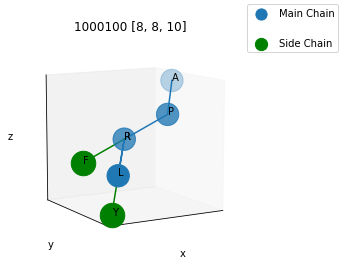

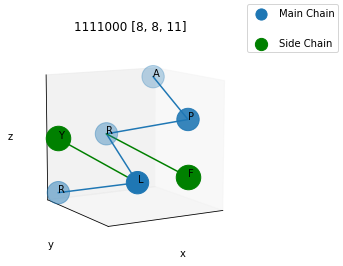

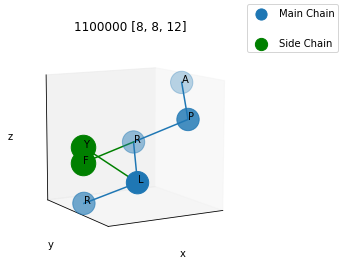

...

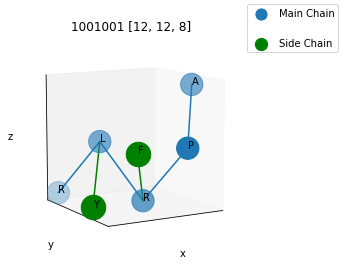

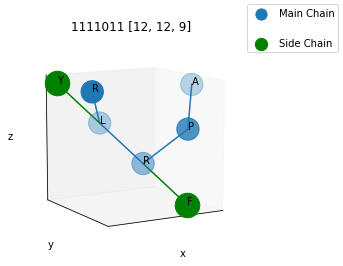

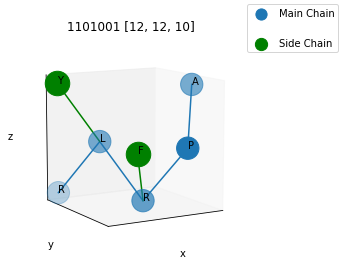

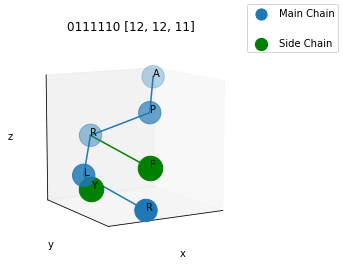

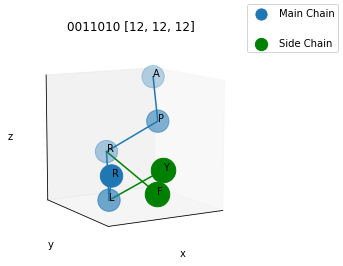

In [35]:
protein_plots(params_list, side_results, side_turn_sequences)

The most commmon sequence here being also 1111000 (ex, 8,8,11), also the result we computed before